In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv('playlist_2014_2016.csv')
df.head()

,Track ID,Track Name,Artists,genres,duration_ms,explicit,popularity,Album,Release Date,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo
0,4jQDaI7FRGaDB0llURpnNf,HER,Block B,NaN,179053,False,54,HER,2014-07-24,0.646,0.897,8,-2.057,1,0.1930,0.04530,0.0,0.1140,0.860,162.017
1,1T03TbRPcIMuqRLGKD5oRS,JACKPOT,Block B,NaN,193302,False,43,HER,2014-07-24,0.690,0.952,9,-2.011,0,0.3450,0.05750,0.0,0.0538,0.726,130.069
2,3dI59jLoFMjMAyUAyRZnkE,BANG BANG BANG,BIGBANG,NaN,220177,False,65,MADE,2016-12-13,0.690,0.843,1,-2.949,1,0.0534,0.01670,0.0,0.3460,0.428,135.010
3,3miMeSGd7rzJEtuhQnzm0f,BAE BAE,BIGBANG,NaN,169429,False,54,MADE,2016-12-13,0.691,0.631,0,-4.804,1,0.0374,0.00674,0.0,0.1860,0.435,139.954
4,26eV0R7nbqtlzh316ncU99,Fantastic Baby,BIGBANG,NaN,230573,False,57,ALIVE,2012-02-29,0.725,0.841,2,-3.924,1,0.0545,0.00200,0.0,0.0652,0.582,130.013


피처들에 대한 설명입니다 하나하나 적기엔 너무 오래 걸릴 거 같아  GPT에게 부탁을 좀 했습니다 ㅎㅎ!

- **Track ID (object)**: Spotify에서 트랙(노래)을 고유하게 식별하기 위해 사용하는 문자열 ID. 각 트랙은 고유한 Track ID를 가지고 있습니다.
- **Track Name (object)**: 노래의 제목을 나타냅니다. 이는 사용자가 Spotify에서 볼 수 있는 트랙의 이름입니다.
- **Artists (object)**: 이 트랙을 수행한 아티스트(가수)의 이름을 나타냅니다. 여러 아티스트가 참여한 경우, 이 정보는 쉼표로 구분된 문자열로 나타날 수 있습니다.
- **duration_ms (int64)**: 노래의 전체 재생 시간(길이)을 밀리초(milliseconds) 단위로 나타냅니다. 예를 들어, 180,000ms는 3분에 해당합니다.
- **explicit (bool)**: 이 열은 트랙에 명시적인(성인) 콘텐츠가 포함되어 있는지 여부를 나타냅니다. `True`는 명시적인 콘텐츠가 포함되어 있음을 의미하며, `False`는 포함되지 않음을 의미합니다.
- **popularity (float64)**: Spotify에서 트랙의 인기도를 나타내는 값입니다. 이 값은 0에서 100 사이의 범위로, 숫자가 클수록 인기가 높은 트랙임을 나타냅니다.
- **Album (object)**: 트랙이 수록된 앨범의 이름을 나타냅니다.
- **Release Date (object)**: 트랙 또는 앨범이 발매된 날짜를 나타냅니다. 이 열은 일반적으로 `YYYY-MM-DD` 형식으로 되어 있지만, 연도만 포함된 경우도 있을 수 있습니다.
- **Danceability (float64)**: 트랙의 댄서빌리티(춤추기 적합성)를 나타내는 값입니다. 이 값은 0.0에서 1.0 사이의 값으로, 높은 값일수록 춤을 추기 적합한 리듬을 가진 트랙임을 의미합니다.
- **Energy (float64)**: 트랙의 에너지 레벨을 나타냅니다. 이 값은 0.0에서 1.0 사이로 측정되며, 값이 클수록 트랙이 강렬하고 활동적인 느낌을 줍니다.
- **Key (int64)**: 트랙의 음악적 키(음조)를 나타내는 값입니다. 이 값은 0에서 11 사이의 정수로, 각각의 숫자는 특정한 음악적 키를 나타냅니다 (예: 0 = C, 1 = C♯/D♭).
- **Loudness (float64)**: 트랙의 전체적인 음량을 데시벨(dB)로 측정한 값입니다. 일반적으로 이 값은 음량이 큰 트랙일수록 더 높은 값을 가집니다.
- **Mode (int64)**: 트랙의 모드(음계)를 나타냅니다. 이 값은 0 또는 1로 나타나며, 0은 단조(minor), 1은 장조(major)를 의미합니다.
- **Speechiness (float64)**: 트랙에서 말하기(스피치)의 요소를 나타내는 값입니다. 이 값이 높을수록 트랙에 스피치 요소가 많음을 의미합니다 (예: 오디오북, 랩 등).
- **Acousticness (float64)**: 트랙이 어쿠스틱한 특성을 얼마나 많이 가지고 있는지를 나타냅니다. 값이 1.0에 가까울수록 어쿠스틱(자연 음향) 성향이 강한 트랙임을 의미합니다.
- **Instrumentalness (float64)**: 트랙에서 보컬이 포함되지 않은 순수 연주곡(Instrumental)의 정도를 나타냅니다. 값이 1.0에 가까울수록 순수 연주곡일 가능성이 높습니다.
- **Liveness (float64)**: 트랙이 라이브 공연에서 녹음된 것인지를 나타내는 값입니다. 값이 1.0에 가까울수록 라이브 공연에서 녹음된 트랙임을 나타냅니다.
- **Valence (float64)**: 트랙의 전반적인 음악적 긍정적 또는 부정적 분위기를 나타냅니다. 값이 1.0에 가까울수록 밝고 긍정적인 분위기의 트랙임을 나타내며, 낮을수록 슬프거나 부정적인 느낌을 줍니다.
- **Tempo (float64)**: 트랙의 템포(속도)를 BPM(Beats Per Minute)으로 나타냅니다. 값이 높을수록 빠른 템포의 곡입니다.


In [3]:
df.describe()

,genres,duration_ms,popularity,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo
count,0.0,3.514000e+03,3514.000000,3514.000000,3514.000000,3514.000000,3514.000000,3514.000000,3514.000000,3514.000000,3514.000000,3514.000000,3514.000000,3514.000000
mean,NaN,2.051529e+05,44.692373,0.629044,0.619943,5.267217,-7.007042,0.669038,0.084225,0.338485,0.069183,0.171989,0.487148,119.353203
std,NaN,4.870401e+04,23.038974,0.163956,0.230851,3.580082,5.602379,0.470626,0.081788,0.308480,0.220368,0.123555,0.247101,26.954036
min,NaN,2.637000e+04,0.000000,0.057000,0.000126,0.000000,-47.374000,0.000000,0.023100,0.000018,0.000000,0.011300,0.026800,36.892000
25%,NaN,1.771530e+05,31.000000,0.533000,0.472000,2.000000,-7.586500,0.000000,0.036200,0.060800,0.000000,0.098000,0.281000,99.857000
50%,NaN,2.029330e+05,44.000000,0.658000,0.654000,5.000000,-5.653000,1.000000,0.049600,0.233500,0.000000,0.121000,0.487000,120.248000
75%,NaN,2.315660e+05,63.000000,0.746750,0.808000,8.000000,-4.231500,1.000000,0.092200,0.610000,0.000086,0.209000,0.687000,134.062500
max,NaN,1.240555e+06,100.000000,0.974000,0.998000,11.000000,0.821000,1.000000,0.750000,0.995000,0.973000,0.923000,0.982000,209.942000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3514 entries, 0 to 3513
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Track ID          3514 non-null   object 
 1   Track Name        3514 non-null   object 
 2   Artists           3514 non-null   object 
 3   genres            0 non-null      float64
 4   duration_ms       3514 non-null   int64  
 5   explicit          3514 non-null   bool   
 6   popularity        3514 non-null   int64  
 7   Album             3512 non-null   object 
 8   Release Date      3514 non-null   object 
 9   Danceability      3514 non-null   float64
 10  Energy            3514 non-null   float64
 11  Key               3514 non-null   int64  
 12  Loudness          3514 non-null   float64
 13  Mode              3514 non-null   int64  
 14  Speechiness       3514 non-null   float64
 15  Acousticness      3514 non-null   float64
 16  Instrumentalness  3514 non-null   float64


In [5]:
df.columns

Index(['Track ID', 'Track Name', 'Artists', 'genres', 'duration_ms',
       'explicit', 'popularity', 'Album', 'Release Date', 'Danceability',
       'Energy', 'Key', 'Loudness', 'Mode', 'Speechiness', 'Acousticness',
       'Instrumentalness', 'Liveness', 'Valence', 'Tempo'],
      dtype='object')

## 데이터 전처리
##### 1. 결측치 확인
##### 2. 데이터 형 변환


In [6]:
df.isnull().sum()

Track ID               0
Track Name             0
Artists                0
genres              3514
duration_ms            0
explicit               0
popularity             0
Album                  2
Release Date           0
Danceability           0
Energy                 0
Key                    0
Loudness               0
Mode                   0
Speechiness            0
Acousticness           0
Instrumentalness       0
Liveness               0
Valence                0
Tempo                  0
dtype: int64

In [75]:
# genres는 아티스트를 통해 불러온다고 했는데 결측치로 가져와졌다...
# 어차피 아티스트를 통해 추정해야하는 정보니 일단 넘기고 분석 진행
# Album의 결측치가 2개가 나왔다 -> 확인해보기
# 확인 결과 2가지 노래 모두 나연의 노래였고 두 곡 모두 앨범 이름이 'NA'였다.
# 2곡 밖에 NaN 된 값이 없으니 값을 추가해줬다.

In [7]:
df[df['Album'].isnull()]


,Track ID,Track Name,Artists,genres,duration_ms,explicit,popularity,Album,Release Date,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo
33,0V2passWyAXnON67kfAj7y,ABCD,NAYEON,NaN,162840,False,80,NaN,2024-06-14,0.682,0.926,3,-2.515,0,0.0607,0.0404,0.0,0.190,0.860,105.969
1039,6pLYWcPnBdFJShuUARDIwj,Magic (Feat. JULIE of KISS OF LIFE),"NAYEON,JULIE",NaN,206613,False,64,NaN,2024-06-14,0.776,0.811,11,-3.974,0,0.1540,0.1960,0.0,0.278,0.896,113.011


In [8]:
# NaN 값 채워주기
df.loc[df['Album'].isnull(), 'Album'] = 'NA'

# Genres 열 drop
df.drop(columns=['genres', 'Track ID'], inplace=True)
df.isnull().sum()

Track Name          0
Artists             0
duration_ms         0
explicit            0
popularity          0
Album               0
Release Date        0
Danceability        0
Energy              0
Key                 0
Loudness            0
Mode                0
Speechiness         0
Acousticness        0
Instrumentalness    0
Liveness            0
Valence             0
Tempo               0
dtype: int64

In [9]:
# Release Date에 년도만 있는 행이 있어서 그런 행들은 년도-01-01 이런 형식으로 처리했다.
df['Release Date'] = df['Release Date'].apply(lambda x: pd.to_datetime(x, errors='coerce') if len(str(x)) > 4 else pd.to_datetime(f"{x}-01-01"))

# 연도만 추출하여 새로운 열에 저장
df['Year'] = df['Release Date'].dt.year

In [10]:
df[['Year']].head()

,Year
0,2014
1,2014
2,2016
3,2016
4,2012


## EDA

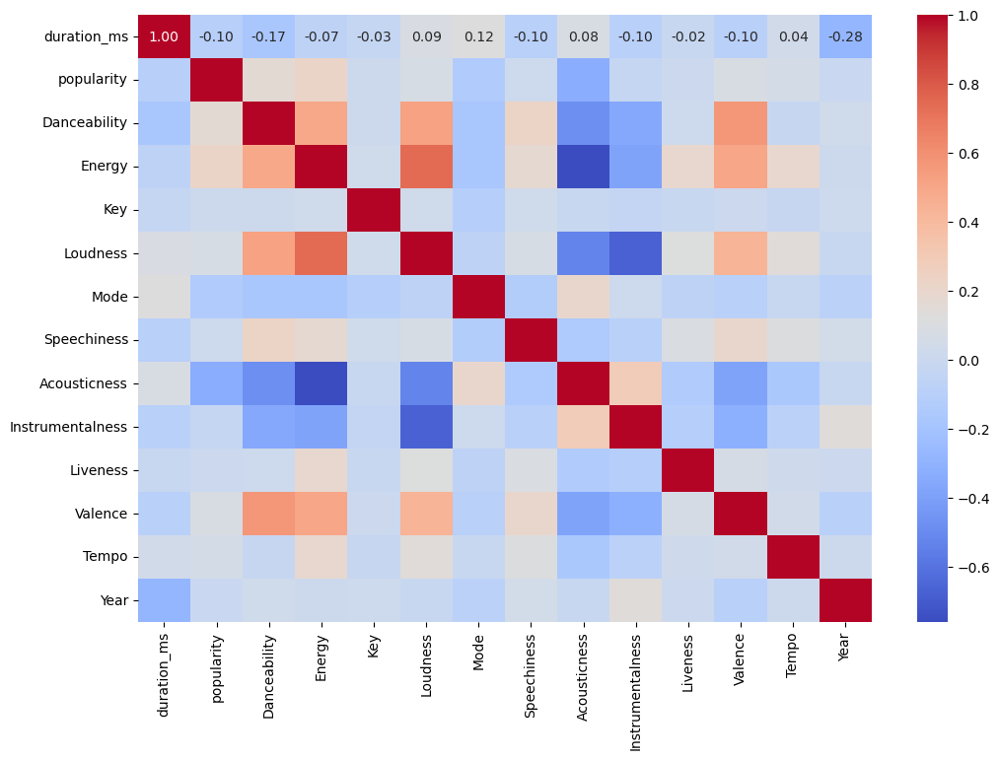

In [80]:
# 숫자형 열만 선택
numeric_df = df.select_dtypes(include=['number'])

# 상관 행렬 계산 및 시각화
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

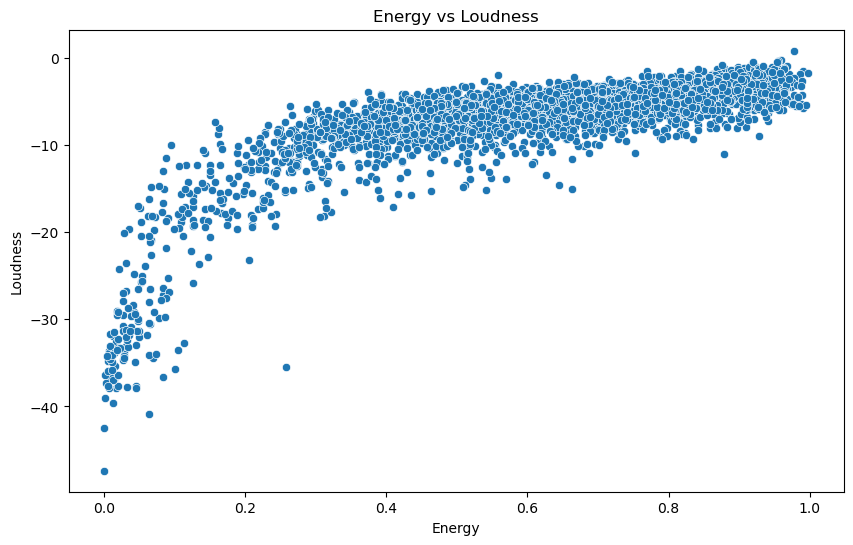

In [51]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Energy', y='Loudness')
plt.title('Energy vs Loudness')
plt.show()

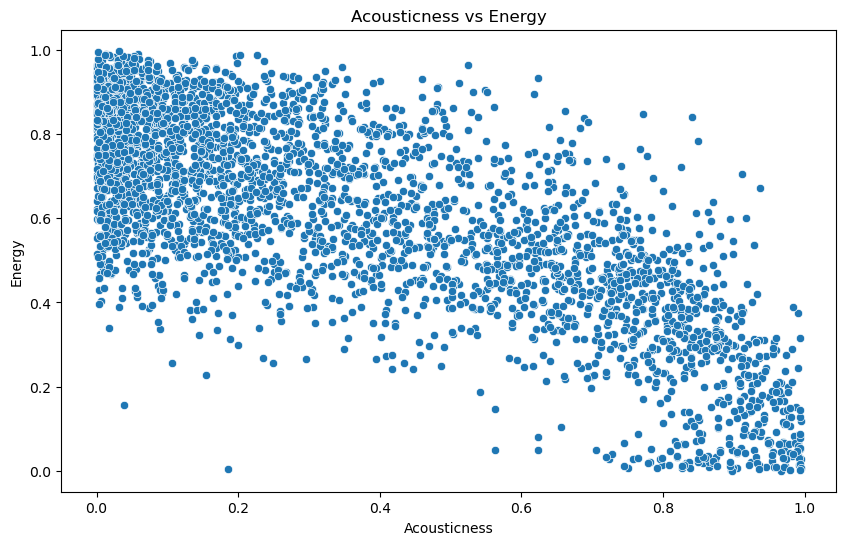

In [52]:
# Acousticness vs Energy
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Acousticness', y='Energy')
plt.title('Acousticness vs Energy')
plt.show()

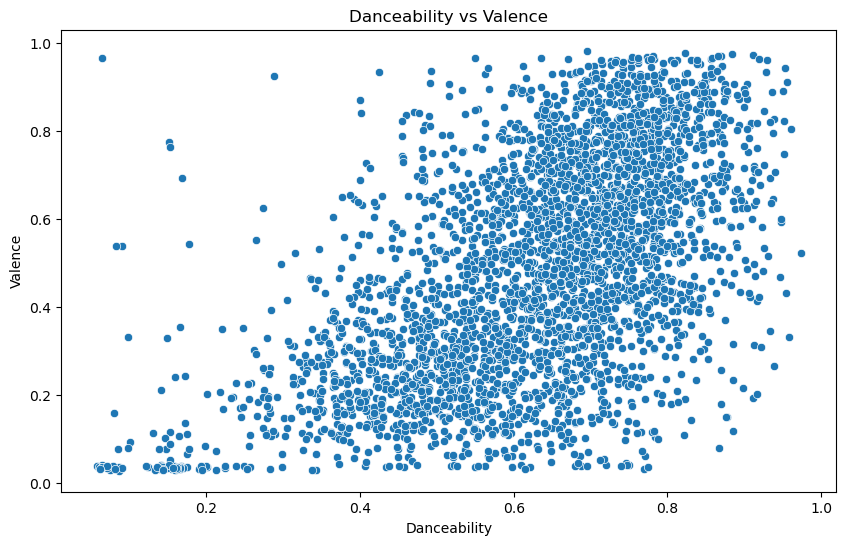

In [53]:
# Danceability vs Valence
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Danceability', y='Valence')
plt.title('Danceability vs Valence')
plt.show()

c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_stats\counting.py:137: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  bin_edges = np.histogram_bin_edges(vals, bins, binrange, weight)
c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_stats\counting.py:176: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist, edges = np.histogram(vals, **bin_kws, weights=weights, density=densit

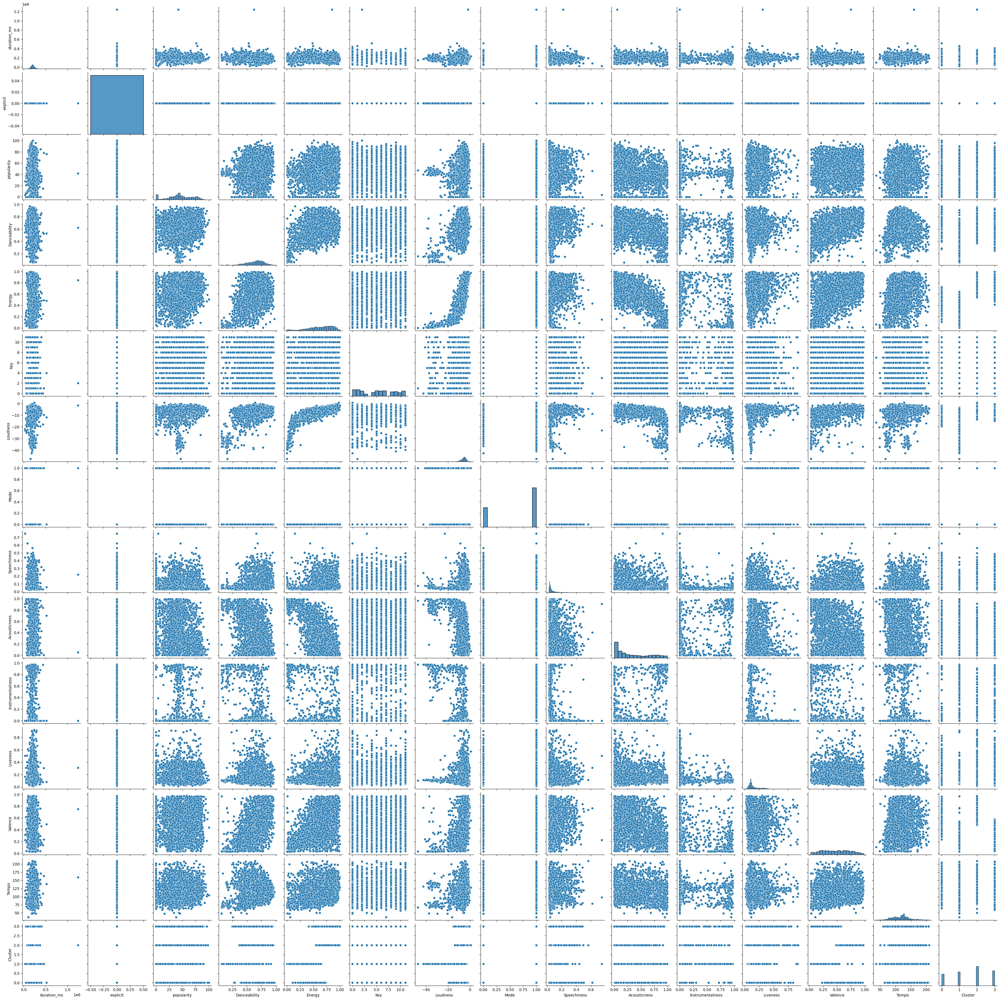

In [37]:
# 피처들 간의 관계를 pairplot으로 시각화 
# 하나하나 해보기엔 귀찮음과 막막함에 좋은 방법을 알게되었다..ㅎ

sns.pairplot(df)
plt.show()

c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


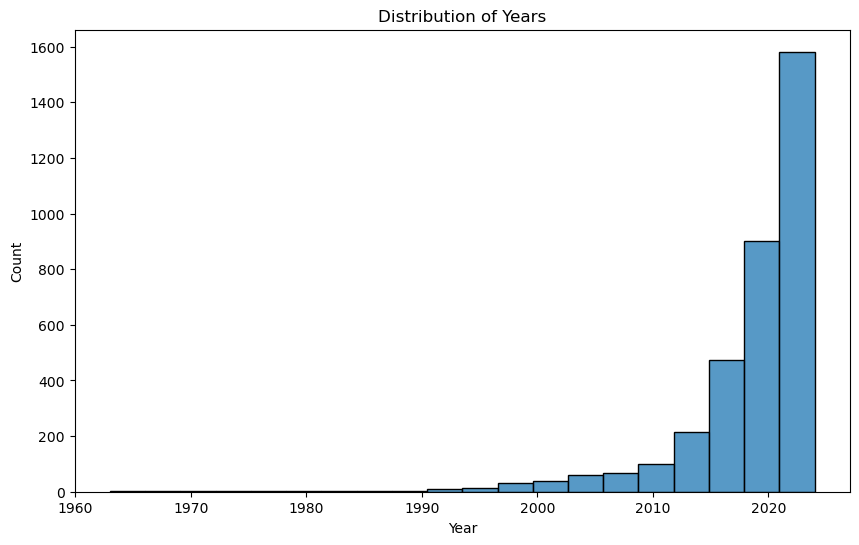

In [7]:
# Year 열의 분포를 히스토그램으로 시각화
plt.figure(figsize=(10, 6))
sns.histplot(df['Year'], bins=20, kde=False)
plt.title('Distribution of Years')
plt.xlabel('Year')
plt.ylabel('Count')
plt.show()

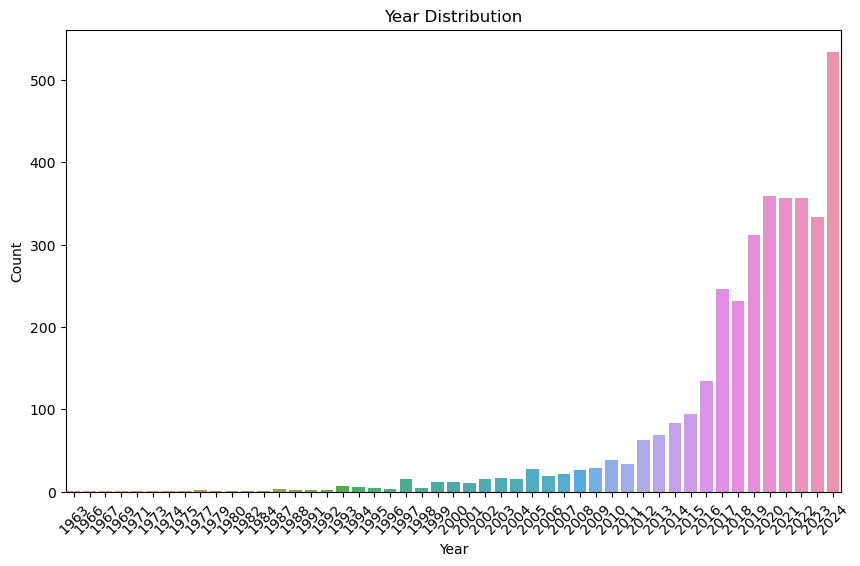

In [8]:
# Year 열의 분포를 막대 그래프로 시각화
plt.figure(figsize=(10, 6))
sns.countplot(x='Year', data=df)
plt.title('Year Distribution')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

spotify 검색항목에 "인기차트" 검색 후 곡을 추출한 결과 2016 ~ 2024 노래가 많은 것을 확인 할 수 있었습니다

년도가 비교적 몰려있어서 아쉬운 결과였습니다

추출된 곡의 분위기에 따라 분류하기 위해서 각각의 피쳐의 분포를 확인해본 결과

c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


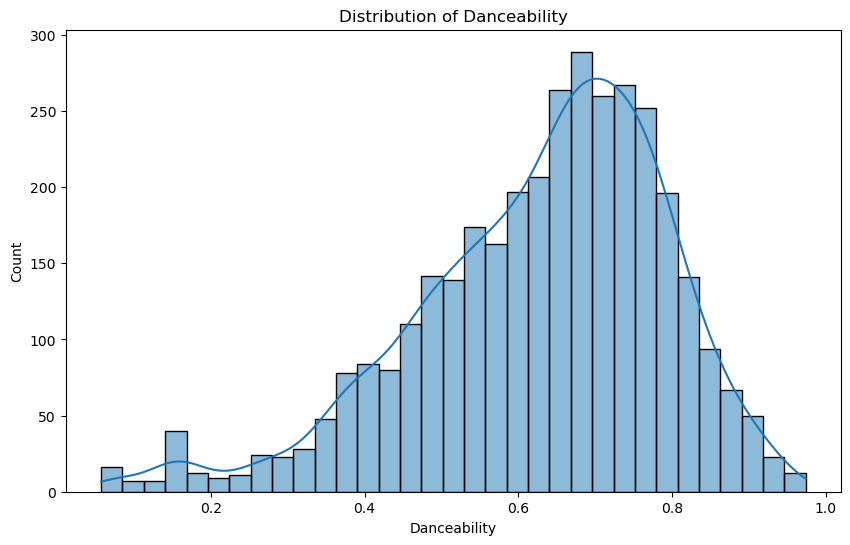

In [54]:
# Danceability 분포
plt.figure(figsize=(10, 6))
sns.histplot(df['Danceability'], kde=True)
plt.title('Distribution of Danceability')
plt.show()

c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


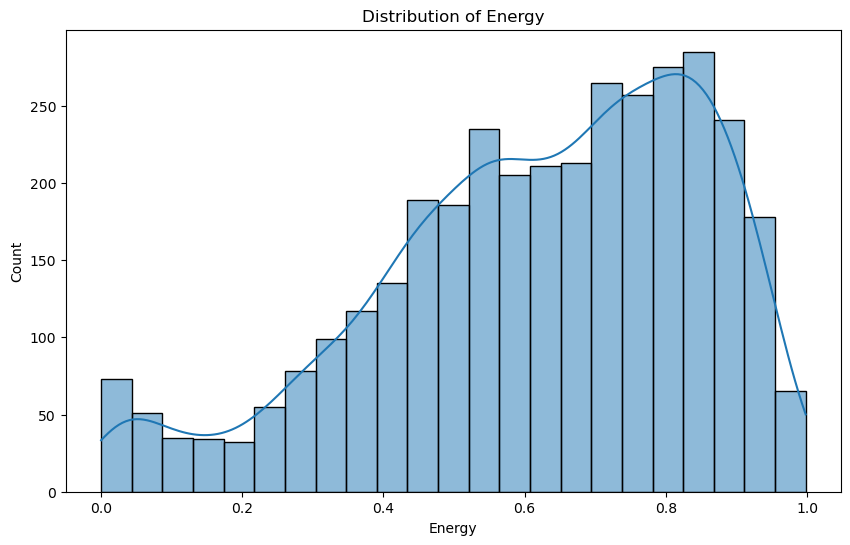

In [55]:
# Energy 분포
plt.figure(figsize=(10, 6))
sns.histplot(df['Energy'], kde=True)
plt.title('Distribution of Energy')
plt.show()

Danceability와 Energy의 분포는 비슷한 것을 알 수 있었고 에너지 넘치고 리듬감 있는 음악이 많이 추출된 결과를 확인할 수 있었습니다.

곡을 추출한 기준이 **인기차트** 인 점이 영향을 주지 않았을까 하는 생각이 듭니다.


c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


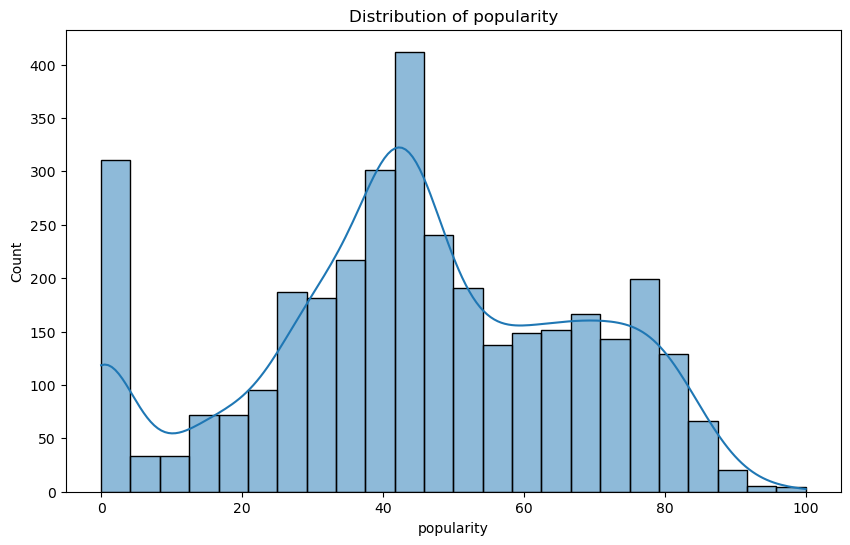

In [56]:
# popularity 분포
plt.figure(figsize=(10, 6))
sns.histplot(df['popularity'], kde=True)
plt.title('Distribution of popularity')
plt.show()

In [ ]:
zero_popularity_df = df[df['popularity'] == 0]
zero_popularity_df.head(40)

,Track Name,Artists,duration_ms,explicit,popularity,Album,Release Date,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Year
23,삐딱하게 (Crooked),G-DRAGON,224792,False,0,COUP D'ETAT,2013-11-05,0.665,0.919,2,-3.211,1,0.0921,0.001910,0.000000,0.0588,0.783,129.961,2013
24,FLOWER ROAD,BIGBANG,228631,False,0,FLOWER ROAD,2018-03-13,0.709,0.654,1,-4.765,0,0.0858,0.124000,0.000000,0.1500,0.624,94.858,2018
193,Dingo X meenoi - DOOL,meenoi,179678,False,0,Dingo X meenoi - DOOL,2021-04-21,0.928,0.525,4,-6.216,1,0.0490,0.816000,0.000183,0.1630,0.933,130.001,2021
199,Island Island,Bye Bye Badman,226199,False,0,AUTHENTIC,2015-06-04,0.612,0.847,7,-5.711,0,0.0830,0.000018,0.000373,0.0519,0.948,104.001,2015
237,What's Been On Your Mind?,Surfaces,172490,False,0,What's Been On Your Mind?,2022-06-10,0.736,0.667,1,-4.716,1,0.0303,0.015800,0.000000,0.1310,0.774,116.973,2022
249,Be Okay (with HRVY),"R3HAB,HRVY",141600,False,0,Be Okay (with HRVY),2020-05-22,0.730,0.558,8,-6.535,1,0.0786,0.017900,0.000000,0.1280,0.618,100.066,2020
258,All My Friends Are Stoned,WizTheMc,159118,False,0,What About Now - EP,2020-10-30,0.794,0.628,6,-4.321,0,0.0328,0.087100,0.000000,0.1810,0.935,121.793,2020
266,Ensom Forevigt,NOAH,197093,False,0,Blandet Musik - Blandet danske sange,2020-06-26,0.753,0.784,11,-3.498,1,0.0302,0.212000,0.000000,0.0481,0.900,102.997,2020
271,10 Things I Hate About You,Leah Kate,157138,False,0,10 Things I Hate About You,2022-03-23,0.562,0.664,8,-7.658,1,0.0556,0.009260,0.000000,0.1770,0.511,153.932,2022
281,Coke & Mentos,salem ilese,127826,False,0,Coke & Mentos,2020-11-17,0.605,0.663,7,-5.396,1,0.1680,0.671000,0.010800,0.1590,0.750,183.361,2020


In [16]:
popularity_df = df[df['popularity'] >= 80]
popularity_df.head(40)

,Track Name,Artists,duration_ms,explicit,popularity,Album,Release Date,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Year
32,Magnetic,ILLIT,160688,False,87,SUPER REAL ME,2024-03-25,0.797,0.668,6,-5.819,1,0.0687,0.25700,0.000000,0.0876,0.690,131.067,2024
33,ABCD,NAYEON,162840,False,80,NA,2024-06-14,0.682,0.926,3,-2.515,0,0.0607,0.04040,0.000000,0.1900,0.860,105.969,2024
34,Sticky,KISS OF LIFE,157120,False,82,Sticky,2024-07-01,0.702,0.701,10,-3.860,0,0.0758,0.39100,0.000000,0.1320,0.595,99.971,2024
35,SHEESH,BABYMONSTER,170356,False,83,BABYMONS7ER,2024-04-01,0.774,0.728,2,-5.079,1,0.1690,0.11300,0.000000,0.0473,0.461,140.041,2024
36,Supernatural,NewJeans,191000,False,83,Supernatural,2024-06-21,0.699,0.708,10,-4.182,0,0.0496,0.18500,0.000008,0.0921,0.863,108.887,2024
37,FOREVER,BABYMONSTER,212734,False,82,FOREVER,2024-07-01,0.833,0.704,0,-4.364,1,0.0502,0.10200,0.000000,0.1010,0.644,129.986,2024
38,Who,Jimin,170887,False,94,MUSE,2024-07-19,0.660,0.756,0,-3.743,0,0.0320,0.00289,0.000000,0.1930,0.838,116.034,2024
39,Standing Next to You,Jung Kook,206019,False,90,GOLDEN,2023-11-03,0.711,0.809,2,-4.389,0,0.0955,0.04470,0.000000,0.3390,0.816,106.017,2023
40,Chk Chk Boom,Stray Kids,148051,False,87,ATE,2024-07-19,0.925,0.740,2,-2.698,1,0.1230,0.16600,0.000000,0.0521,0.844,101.994,2024
41,The Astronaut,JIN,282463,False,85,The Astronaut,2022-10-28,0.540,0.761,5,-5.356,1,0.0311,0.00446,0.000003,0.1370,0.215,124.988,2022


population 분포를 확인하고 0인 것들과 어떤 차이가 있는지 확인해봤습니다. 

하지만 제 기준에서는 이게 0이라고? 하는 정말 인기있는 곡들도 있었습니다(빅뱅, 지드래곤, NELL) 

확인 결과, 이 컬럼은 이 곡의 인기도가 아닌 **재생횟수와 최근 사용자 활동을 기반으로 부여되는 점수**라고 합니다 

특히 한국의 경우 Spotify보다는 멜론, 지니뮤직, FLO와 같은 국내 스트리밍 서비스를 더 많이 이용하기 때문에, 국내 인기곡이라 하더라도 Spotify에서는 낮은 popularity 점수를 받을 수 있다고 생각합니다.

오래된 곡이나 일시적으로 재생량이 적은 곡의 경우, 실제 인지도와 무관하게 낮은 popularity 점수를 가질 수 있어 주의해야 할 것 같습니다

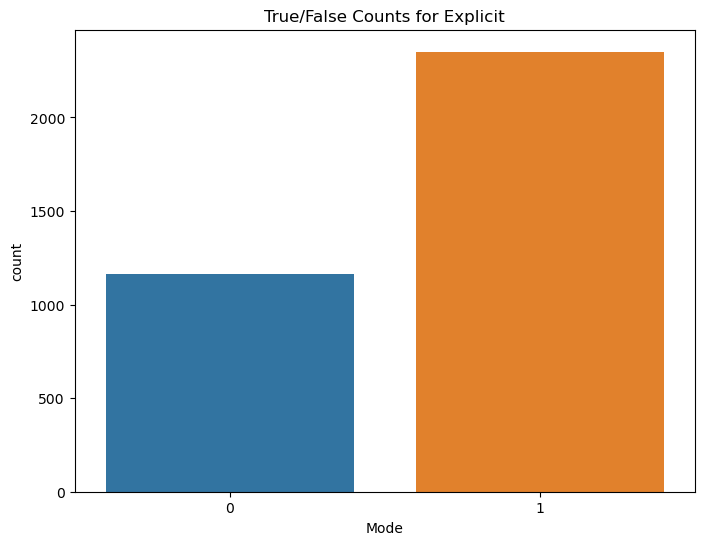

In [58]:
# explicit 열에 대한 True/False 개수 시각화
plt.figure(figsize=(8, 6))
sns.countplot(x='Mode', data=df)
plt.title('True/False Counts for Explicit')
plt.show()

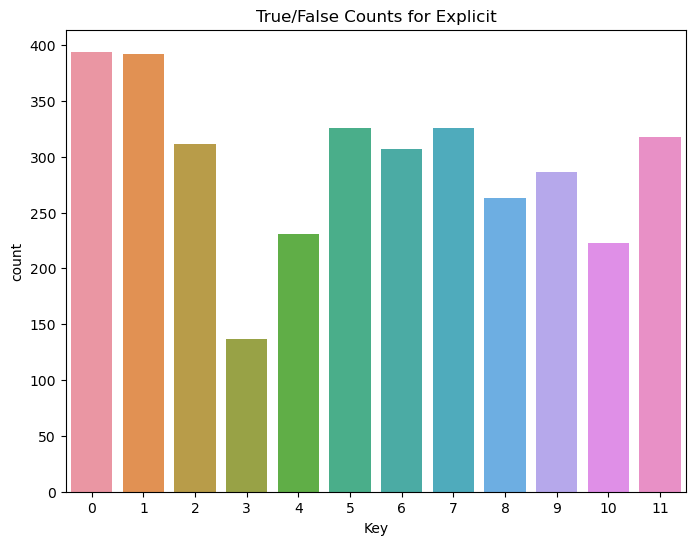

In [59]:
# Key의 분포
# 이건 제가 음악에 대해 잘 몰라서 노래의 Key에 따라서도 분위기 뭐 그런 분류가 될 수 있을까 싶었습니다..하ㅏ하
plt.figure(figsize=(8, 6))
sns.countplot(x='Key', data=df)
plt.title('True/False Counts for Explicit')
plt.show()

In [60]:
df['Key'].unique()
#C/ C#/  D/  D#/  E/  F/ F#/ G/ G#/ A/ A#/ B 총 12개

array([ 8,  9,  1,  0,  2,  5,  4,  6, 11,  3,  7, 10], dtype=int64)

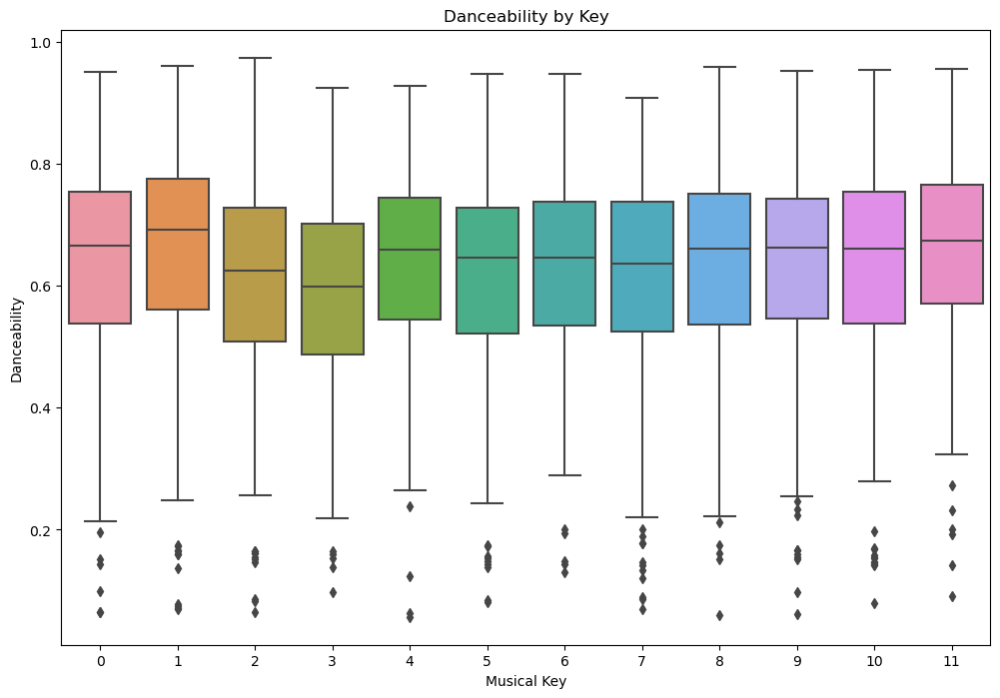

In [61]:
# Key에 따른 Danceability 분포 시각화 (박스플롯)
plt.figure(figsize=(12, 8))
sns.boxplot(x='Key', y='Danceability', data=df)
plt.title('Danceability by Key')
plt.xlabel('Musical Key')
plt.ylabel('Danceability')
plt.show()

C:\Users\trump\AppData\Local\Temp\ipykernel_34172\4285432424.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Key', y='Danceability', data=df, ci=None)


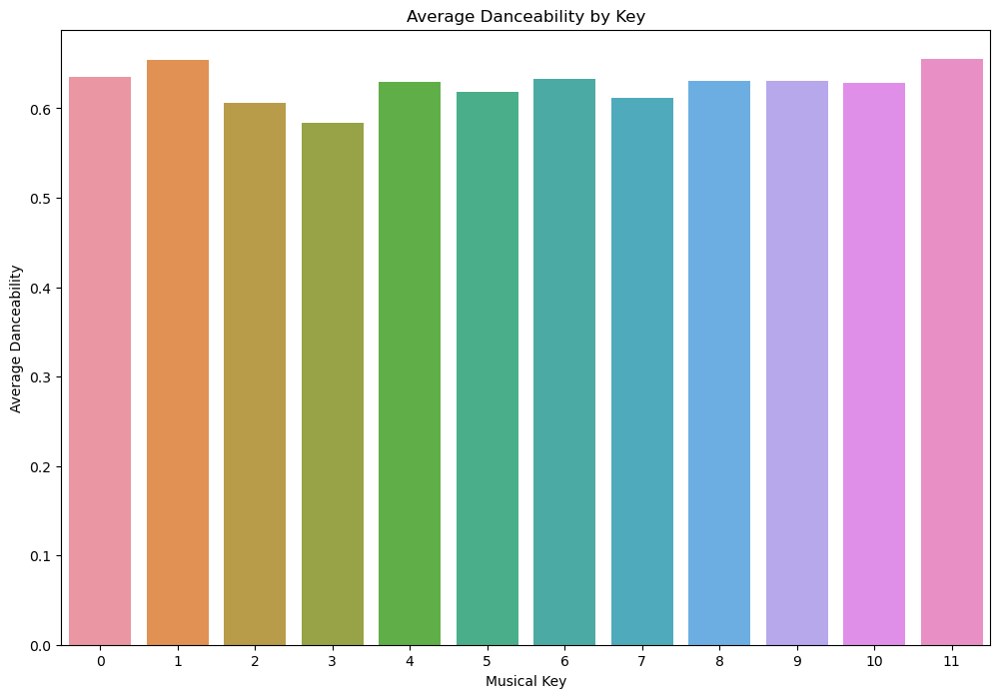

In [62]:
# Key에 따른 Danceability 평균 시각화 (바플롯)
plt.figure(figsize=(12, 8))
sns.barplot(x='Key', y='Danceability', data=df, ci=None)
plt.title('Average Danceability by Key')
plt.xlabel('Musical Key')
plt.ylabel('Average Danceability')
plt.show()

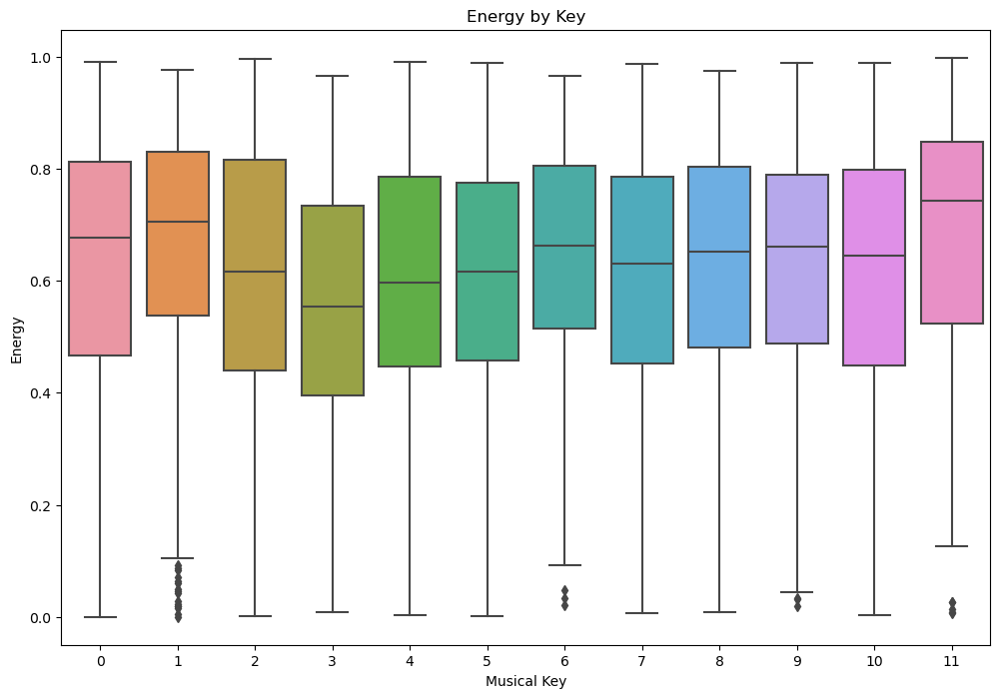

In [63]:
# Key에 따른 Danceability 분포 시각화 (박스플롯)
plt.figure(figsize=(12, 8))
sns.boxplot(x='Key', y='Energy', data=df)
plt.title('Energy by Key')
plt.xlabel('Musical Key')
plt.ylabel('Energy')
plt.show()

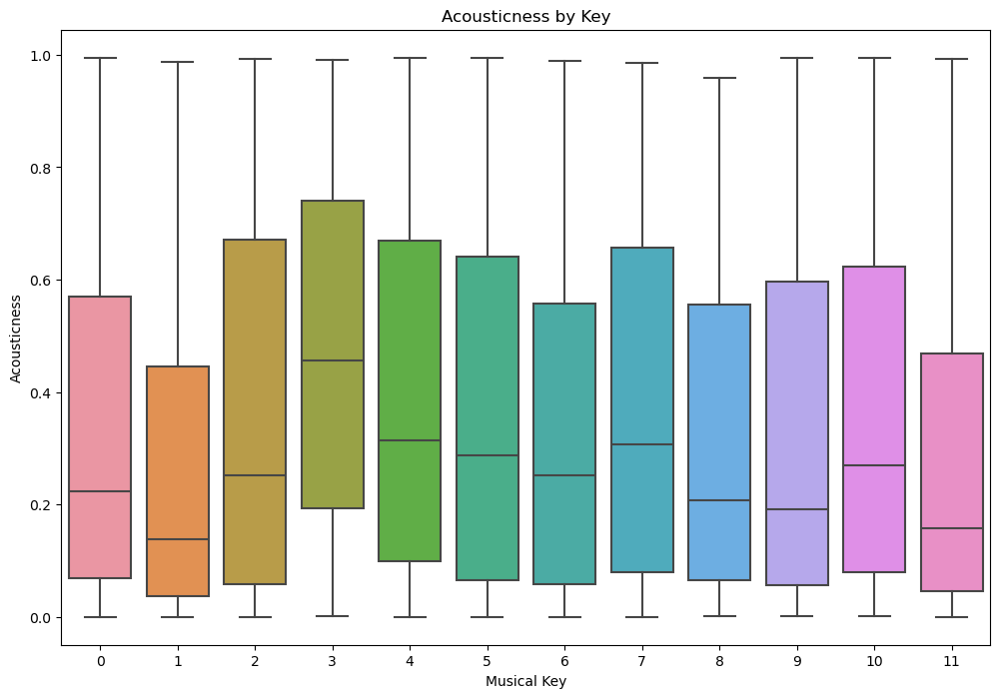

In [64]:
# Key에 따른 Danceability 분포 시각화 (박스플롯)
plt.figure(figsize=(12, 8))
sns.boxplot(x='Key', y='Acousticness', data=df)
plt.title('Acousticness by Key')
plt.xlabel('Musical Key')
plt.ylabel('Acousticness')
plt.show()

그래프의 결과에서 딱히 특이점을 느끼지 못했습니다..

key 을 가지고만은 정확한 음악 분류가 되지 않을 거 같다는 생각이 들었습니다. 

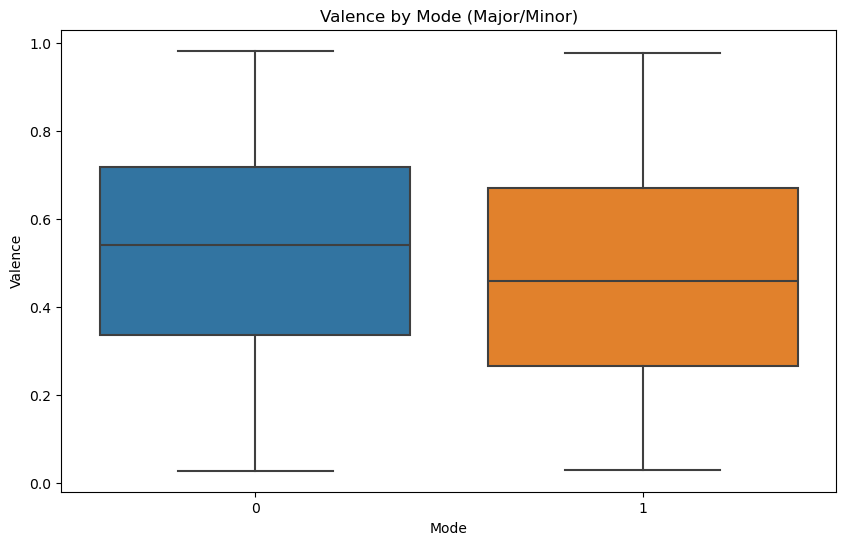

In [65]:
# Mode에 따른 Valence 차이
plt.figure(figsize=(10, 6))
sns.boxplot(x='Mode', y='Valence', data=df)
plt.title('Valence by Mode (Major/Minor)')
plt.show()

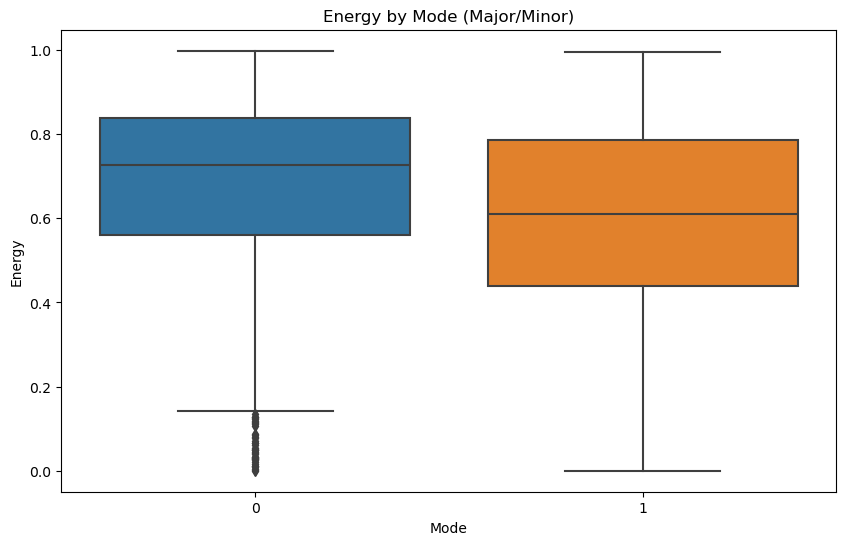

In [66]:
# Mode에 따른 Energy 차이
plt.figure(figsize=(10, 6))
sns.boxplot(x='Mode', y='Energy', data=df)
plt.title('Energy by Mode (Major/Minor)')
plt.show()

c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


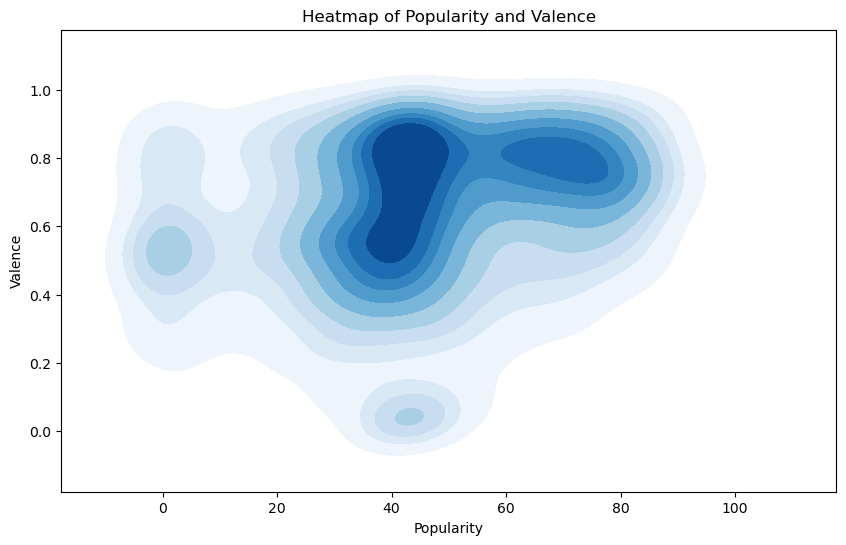

In [68]:
# popularity와 valence의 히트맵
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df, x='popularity', y='Energy', cmap="Blues", fill=True)
plt.title('Heatmap of Popularity and Valence')
plt.xlabel('Popularity')
plt.ylabel('Valence')
plt.show()

c:\Users\trump\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


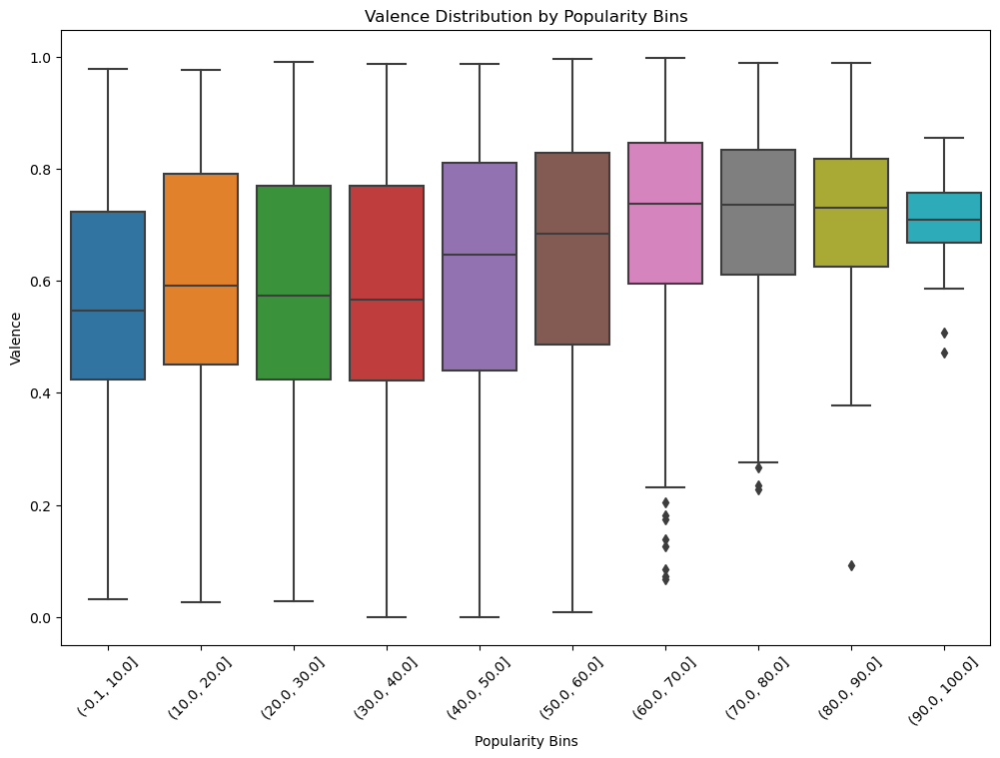

In [69]:
# popularity를 구간별로 나누고 각 구간의 valence를 박스플롯으로 시각화
df['popularity_bins'] = pd.cut(df['popularity'], bins=10)
plt.figure(figsize=(12, 8))
sns.boxplot(x='popularity_bins', y='Energy', data=df)
plt.title('Valence Distribution by Popularity Bins')
plt.xlabel('Popularity Bins')
plt.ylabel('Valence')
plt.xticks(rotation=45)
plt.show()

## ML Modeling
k 클러스터링 진행

In [9]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans


In [10]:
df.columns

Index(['Track ID', 'Track Name', 'Artists', 'genres', 'duration_ms',
       'explicit', 'popularity', 'Album', 'Release Date', 'Danceability',
       'Energy', 'Key', 'Loudness', 'Mode', 'Speechiness', 'Acousticness',
       'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Year'],
      dtype='object')

일단 모든 피처를 넣고 수행했습니다

In [11]:
# 사용할 feature
original_ds = df[['duration_ms', 'popularity',
       'Danceability', 'Energy', 'Key', 'Loudness',
       'Mode', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness',
       'Valence', 'Tempo']]


In [12]:
# 스케일링
scaler = StandardScaler()
scaled_ds = scaler.fit_transform(original_ds)

### K-cluster

In [13]:
inertia = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_ds)
    inertia.append(kmeans.inertia_)

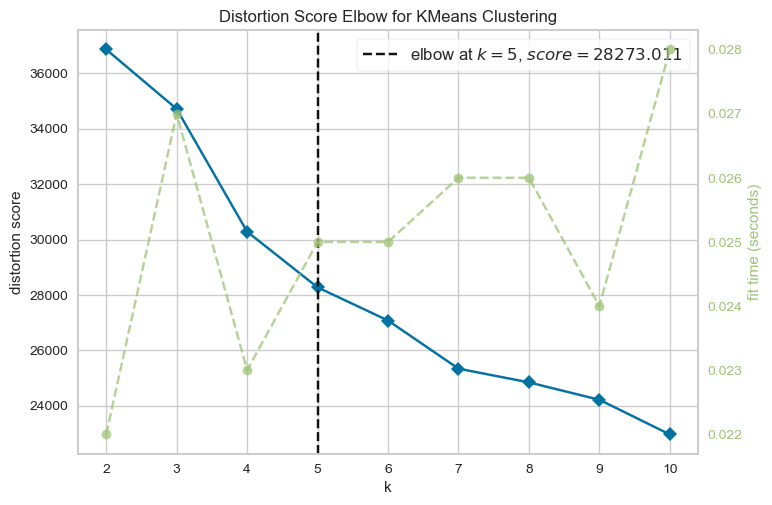

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [49]:
Elbow_M = KElbowVisualizer(KMeans(random_state=42), k=10)
Elbow_M.fit(scaled_ds)
Elbow_M.show()

아까 회의때 말씀해주신 엘보우 그래프 첨부했습니다! 그래프 상 5개의 클러스터가 좋다하여 코드를 조금 수정했습니다

In [50]:
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(scaled_ds)
df['Cluster'] = clusters

In [44]:
df.columns

Index(['Track ID', 'Track Name', 'Artists', 'genres', 'duration_ms',
       'explicit', 'popularity', 'Album', 'Release Date', 'Danceability',
       'Energy', 'Key', 'Loudness', 'Mode', 'Speechiness', 'Acousticness',
       'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Year', 'Cluster',
       'Cluster_PCA', 'Energy_scaled', 'Danceability_scaled', 'Valence_scaled',
       'R', 'G', 'B'],
      dtype='object')

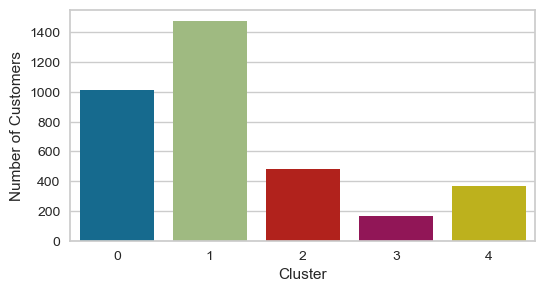

In [51]:
plt.figure(figsize=(6, 3))
sns.countplot(x='Cluster', data=df)
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.show()

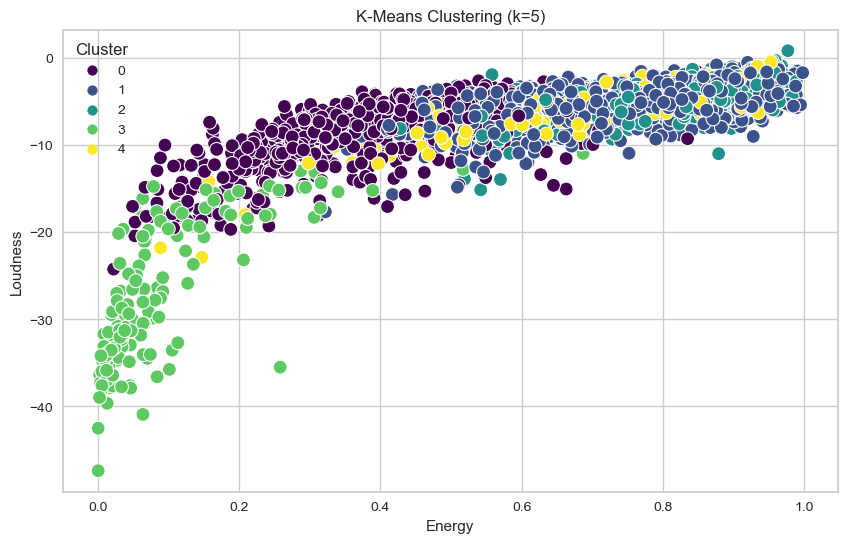

In [52]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Energy', y='Loudness', hue='Cluster', palette='viridis', data=df, s=100)
plt.title('K-Means Clustering (k={})'.format(optimal_k))
plt.show()

In [53]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(scaled_ds, clusters)
print(silhouette_avg)

0.15524281705042503


실루엣 계수 결과 성능이 안 좋아서 PCA + k-mean 을 통해 성능을 높이고자 시도해봤습니다

#### PCA

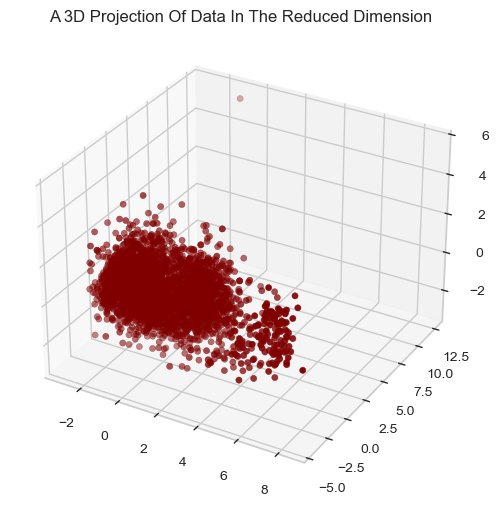

In [19]:
pca = PCA(n_components=3)
pca.fit(scaled_ds)

PCA_ds = pd.DataFrame(pca.transform(scaled_ds), columns=(["col1","col2", "col3"]))
PCA_ds.describe().T


#A 3D Projection Of Data In The Reduced Dimension
x =PCA_ds["col1"]
y =PCA_ds["col2"]
z =PCA_ds["col3"]
#To plot
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

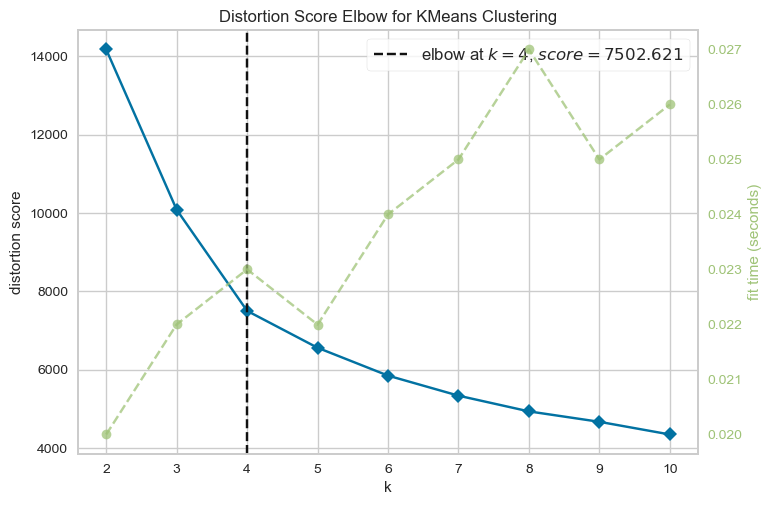

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [48]:
# Quick examination of elbow method to find numbers of clusters to make.
Elbow_M = KElbowVisualizer(KMeans(random_state=42), k=10)
Elbow_M.fit(PCA_ds)
Elbow_M.show()

In [21]:
# Initiating the KMeans Clustering model
kmeans_PCA = KMeans(n_clusters=4, random_state=42)
# Fit model and predict clusters
cluster_labels = kmeans_PCA.fit_predict(PCA_ds)  # Changed variable name from yhat_kmeans to cluster_labels
PCA_ds["Cluster_PCA"] = cluster_labels
# Adding the Clusters feature to the original dataframe.
df["Cluster_PCA"] = cluster_labels

In [22]:
import numpy as np

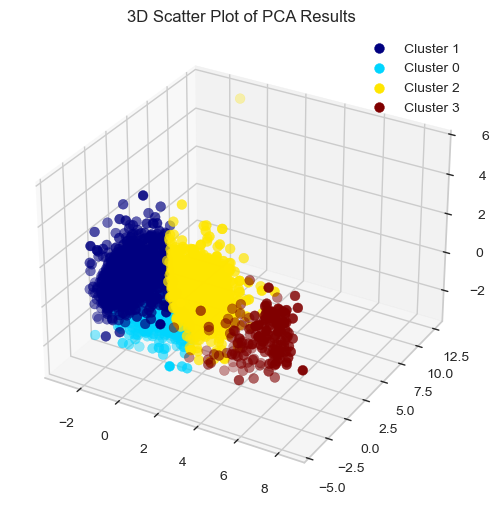

In [26]:
# Create a new figure for the 3D plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Extract columns for the plot
x = PCA_ds['col1']
y = PCA_ds['col2']
z = PCA_ds['col3']

# Get unique clusters
clusters_PCA = PCA_ds['Cluster_PCA'].unique()

# Color map for clusters
colors = plt.cm.jet(np.linspace(0, 1, len(clusters_PCA)))

# Plot each cluster
for cluster, color in zip(clusters_PCA, colors):
    ix = PCA_ds['Cluster_PCA'] == cluster
    ax.scatter(x[ix], y[ix], z[ix], c=[color], label=f'Cluster {cluster}', s=50)

ax.set_title('3D Scatter Plot of PCA Results')
ax.legend()
plt.show()

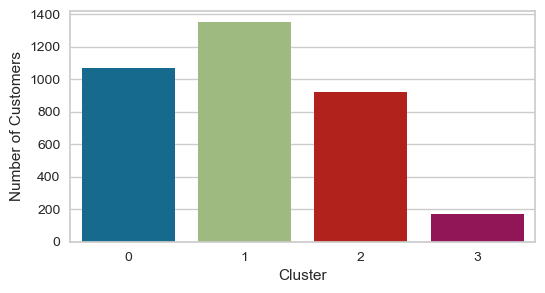

In [27]:
plt.figure(figsize=(6, 3))
sns.countplot(x='Cluster_PCA', data=df)
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.show()

In [36]:
df.head()

,Track ID,Track Name,Artists,genres,duration_ms,explicit,popularity,Album,Release Date,Danceability,...,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Year,Cluster,Cluster_PCA
0,4jQDaI7FRGaDB0llURpnNf,HER,Block B,NaN,179053,False,54,HER,2014-07-24,0.646,...,1,0.1930,0.04530,0.0,0.1140,0.860,162.017,2014,1,1
1,1T03TbRPcIMuqRLGKD5oRS,JACKPOT,Block B,NaN,193302,False,43,HER,2014-07-24,0.690,...,0,0.3450,0.05750,0.0,0.0538,0.726,130.069,2014,1,1
2,3dI59jLoFMjMAyUAyRZnkE,BANG BANG BANG,BIGBANG,NaN,220177,False,65,MADE,2016-12-13,0.690,...,1,0.0534,0.01670,0.0,0.3460,0.428,135.010,2016,2,1
3,3miMeSGd7rzJEtuhQnzm0f,BAE BAE,BIGBANG,NaN,169429,False,54,MADE,2016-12-13,0.691,...,1,0.0374,0.00674,0.0,0.1860,0.435,139.954,2016,1,1
4,26eV0R7nbqtlzh316ncU99,Fantastic Baby,BIGBANG,NaN,230573,False,57,ALIVE,2012-02-29,0.725,...,1,0.0545,0.00200,0.0,0.0652,0.582,130.013,2012,1,1


In [37]:
silhouette_avg = silhouette_score(PCA_ds, df['Cluster_PCA'])
print(silhouette_avg)

0.37394154450939365


그냥 K-mean만 사용했을 때 보다는 성능이 좋아졌지만 아직 부족한 느낌이드네요

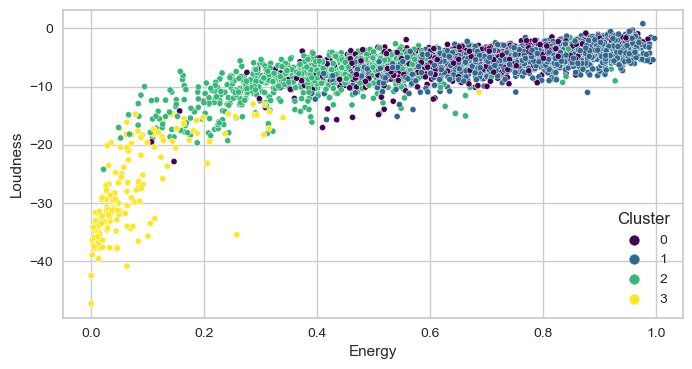

In [54]:
# 분류가 잘 되었는지 산점도로 확인해보기

plt.figure(figsize=(8, 4))
sns.scatterplot(x='Energy', y='Loudness', hue='Cluster_PCA', data=df, palette='viridis', s=20)
plt.xlabel('Energy')
plt.ylabel('Loudness')
plt.legend(title='Cluster')
plt.show()

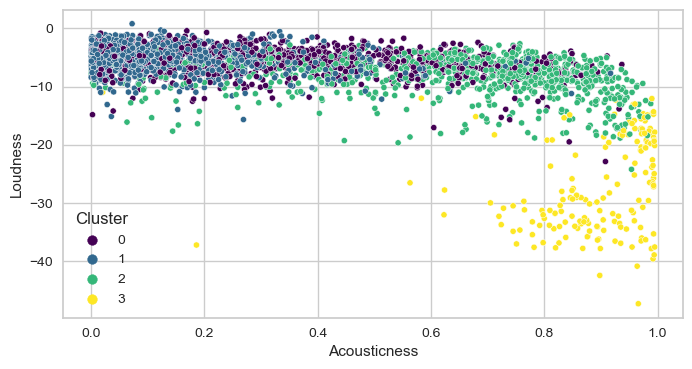

In [55]:
#scatter plot
plt.figure(figsize=(8, 4))
sns.scatterplot(x='Acousticness', y='Loudness', hue='Cluster_PCA', data=df, palette='viridis', s=20)
plt.xlabel('Acousticness')
plt.ylabel('Loudness')
plt.legend(title='Cluster')
plt.show()

나름 잘 분류된 거 같은데 4개의 클러스터만으로 노래가 분류되려나.? 싶은 생각이 듭니다

c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\trump\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length

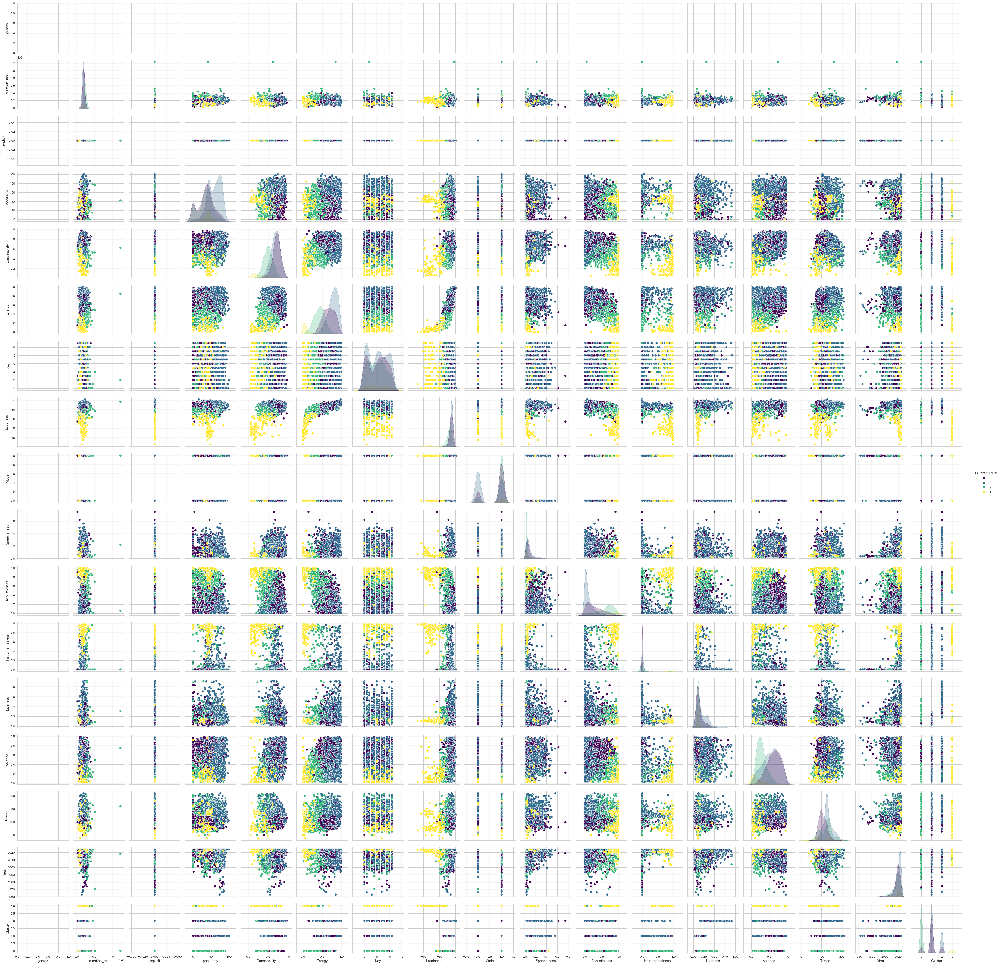

In [38]:
sns.pairplot(df, hue="Cluster_PCA", palette="viridis")
plt.show()

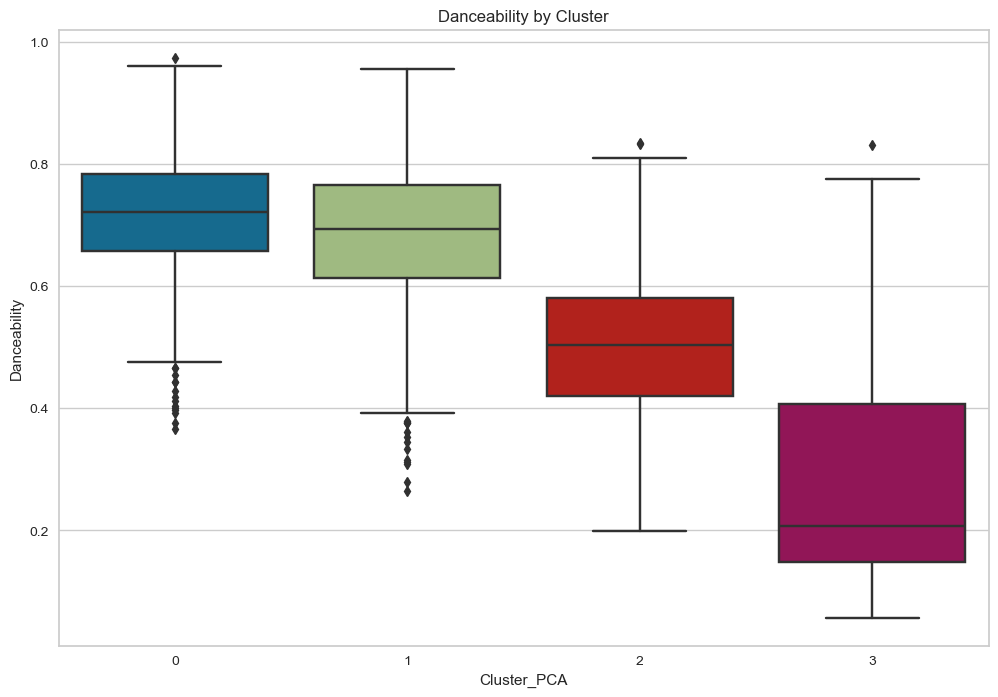

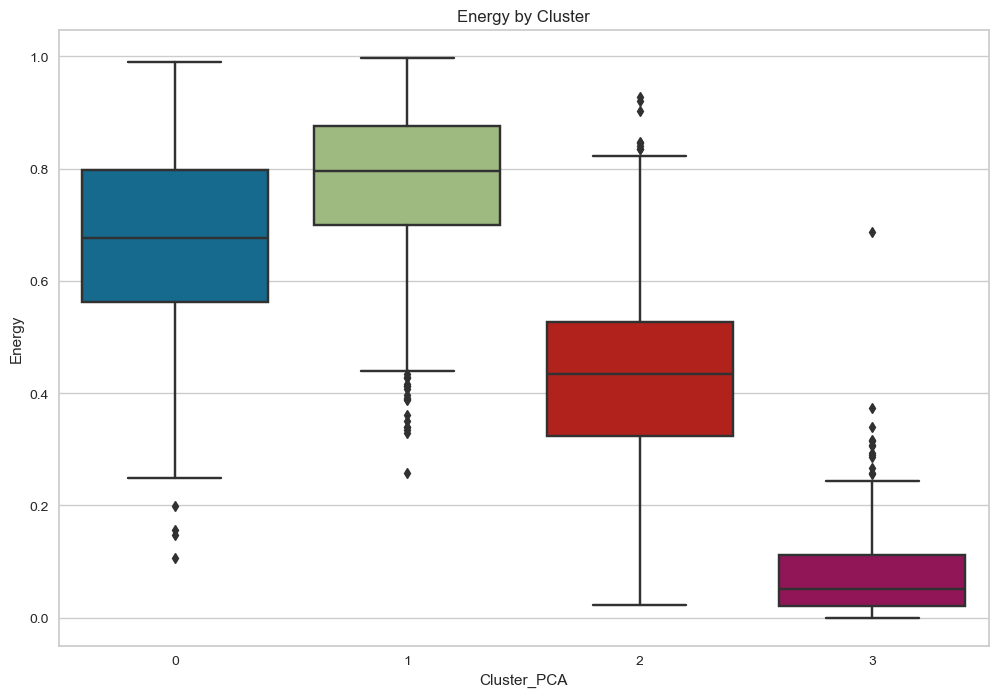

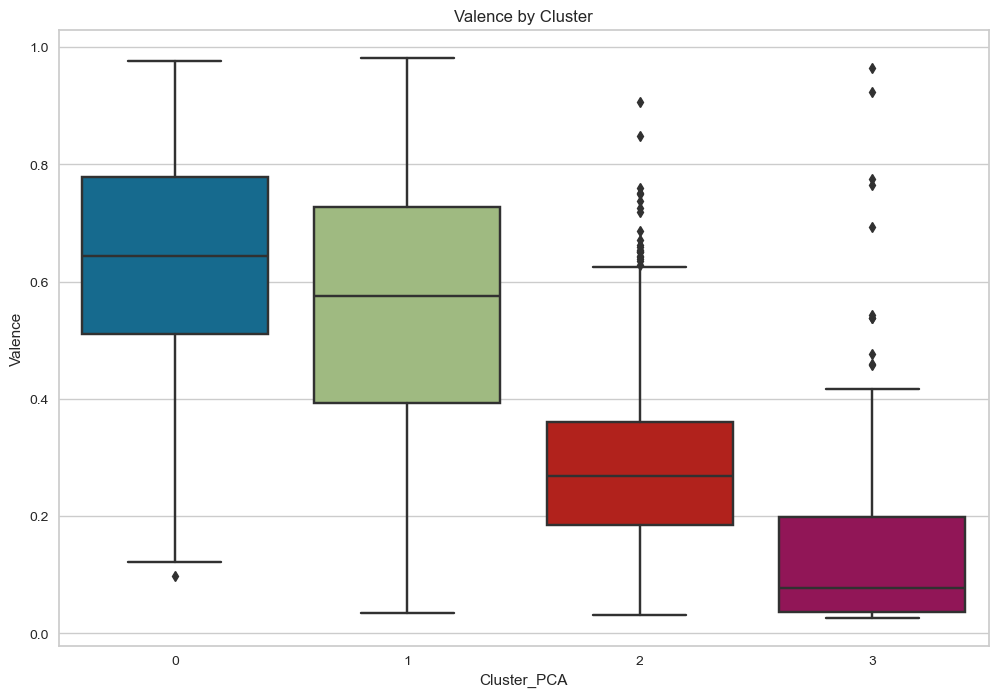

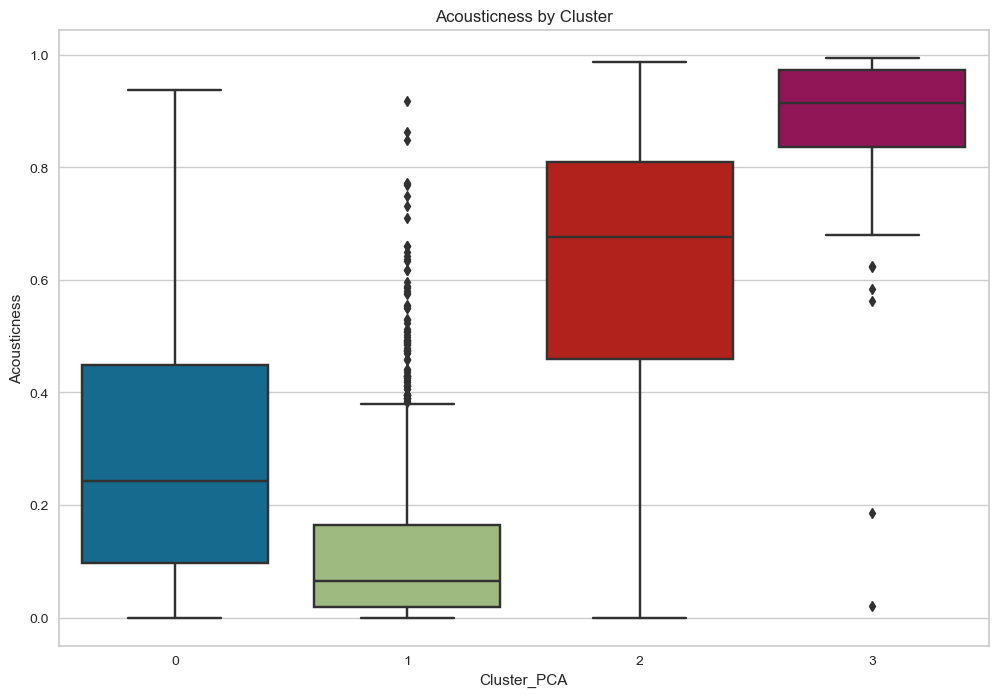

In [47]:
# 클러스터별 Danceability, Energy, Valence 분포 시각화
plt.figure(figsize=(12, 8))
sns.boxplot(x='Cluster_PCA', y='Danceability', data=df)
plt.title('Danceability by Cluster')
plt.show()

plt.figure(figsize=(12, 8))
sns.boxplot(x='Cluster_PCA', y='Energy', data=df)
plt.title('Energy by Cluster')
plt.show()

plt.figure(figsize=(12, 8))
sns.boxplot(x='Cluster_PCA', y='Valence', data=df)
plt.title('Valence by Cluster')
plt.show()

plt.figure(figsize=(12, 8))
sns.boxplot(x='Cluster_PCA', y='Acousticness', data=df)
plt.title('Acousticness by Cluster')
plt.show()

cluster, pairplot 한 결과를 통해 r, g, b 값을 하나의 피처로 나타낸다면 Energy, Danceability, Valence 가 제일 곡을 잘 분류할 수 있지 않을까..?
Acousticness 의 피처도 포함이 되면 더 좋은 분류를 할 수 있을 거 같다

++ 19일팀 회의 때 석준님이 색을 분류해놓신 기준을 보고 저렇게도 분류할 수 있겠구나 많이 배웠습니다..! 
단순하게 Energy, Danceability, Valence, Acousticness 피처들에서 고르자 
-> R 빨강? Energy -> G 초록? Danceability -> B 파랑? 분위기를 나타내면 좋을 거 같다! Valence 
저는 이런 식으로 피처를 골랐었습니다 하핳

In [41]:
# RGB 매핑을 위해 피처를 0~1 범위로 스케일링
df['Energy_scaled'] = (df['Energy'] - df['Energy'].min()) / (df['Energy'].max() - df['Energy'].min())
df['Danceability_scaled'] = (df['Danceability'] - df['Danceability'].min()) / (df['Danceability'].max() - df['Danceability'].min())
df['Valence_scaled'] = (df['Valence'] - df['Valence'].min()) / (df['Valence'].max() - df['Valence'].min())

[[229.19012821 163.78953108 222.43090452]
 [243.24500889 176.02508179 186.65829146]
 [215.39079082 176.02508179 107.10427136]
 ...
 [198.01384744 193.26608506 151.68655779]
 [169.39299952 150.99781897  69.1959799 ]
 [189.32537575 176.30316249 143.94472362]]


In [43]:
# 기존의 RGB 값을 0~255 범위로 변환
df['R'] = (df['Energy_scaled'] * 255).astype(int)
df['G'] = (df['Danceability_scaled'] * 255).astype(int)
df['B'] = (df['Valence_scaled'] * 255).astype(int)

# 원하는 열만 선택
output_df = df[['Track ID', 'Track Name', 'Artists', 'R', 'G', 'B']]

# 새로운 파일로 저장 (예: CSV 파일로 저장)
output_df.to_csv('music_with_rgb.csv', index=False)

print("RGB 값을 포함한 데이터가 'music_with_rgb.csv'로 저장되었습니다.")

RGB 값을 포함한 데이터가 'music_with_rgb.csv'로 저장되었습니다.
